In [31]:
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from scipy.signal import filtfilt, butter, lfilter, sosfiltfilt
from scipy.signal import kaiserord, lfilter, firwin, freqz, firwin2


np.set_printoptions(precision=3, suppress=True)

In [2]:
from src.settings import TARGET_COLS

In [3]:
def load_data():
    df = pl.read_csv("./data/train.csv")
    return df


def get_random_eeg_data(df, eeg_id=None, eeg_sub_id=None):
    if eeg_id is None:
        eeg_id = np.random.choice(df["eeg_id"].unique().to_list(), 1)[0]
    df_ = df.filter(pl.col("eeg_id") == eeg_id)
    if eeg_sub_id is None:
        eeg_sub_id = np.random.choice(df_["eeg_sub_id"].unique().to_list(), 1)[0]
    targets = (
        df_.filter(pl.col("eeg_sub_id") == eeg_sub_id).select(TARGET_COLS).to_dict()
    )
    data = np.load(f"./data/train_eegs/{eeg_id}_{eeg_sub_id}.npy")
    return data, eeg_id, eeg_sub_id, targets

In [9]:
def plot_eeg_data(data, sample_rate=200):
    fig = make_subplots(
        rows=4, cols=1, shared_xaxes=True, shared_yaxes=True, vertical_spacing=0.02
    )
    fig.add_trace(
        go.Scatter(
            x=np.arange(len(data)) / sample_rate,
            y=data[:, 0],
            mode="lines",
            name="channel 1",
        ),
        row=1,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=np.arange(len(data)) / sample_rate,
            y=data[:, 1],
            mode="lines",
            name="channel 2",
        ),
        row=2,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=np.arange(len(data)) / sample_rate,
            y=data[:, 2],
            mode="lines",
            name="channel 3",
        ),
        row=3,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=np.arange(len(data)) / sample_rate,
            y=data[:, 3],
            mode="lines",
            name="channel 4",
        ),
        row=4,
        col=1,
    )
    fig.update_layout(title_text="EEG data", height=600, width=1200)
    fig.show()

In [10]:
df = load_data()

In [11]:
eeg_data, eeg_id, eeg_sub_id, targets = get_random_eeg_data(df)
print(eeg_id, eeg_sub_id, targets)

648913136 0 {'seizure_vote': shape: (1,)
Series: 'seizure_vote' [i64]
[
	0
], 'lpd_vote': shape: (1,)
Series: 'lpd_vote' [i64]
[
	0
], 'gpd_vote': shape: (1,)
Series: 'gpd_vote' [i64]
[
	11
], 'lrda_vote': shape: (1,)
Series: 'lrda_vote' [i64]
[
	0
], 'grda_vote': shape: (1,)
Series: 'grda_vote' [i64]
[
	0
], 'other_vote': shape: (1,)
Series: 'other_vote' [i64]
[
	1
]}


In [70]:
eeg_data = eeg_data - np.median(eeg_data, axis=0)

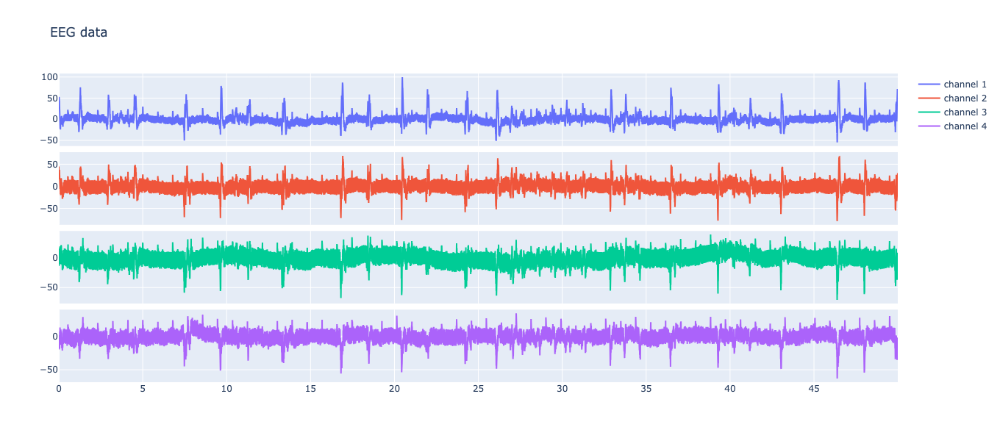

In [71]:
plot_eeg_data(eeg_data)

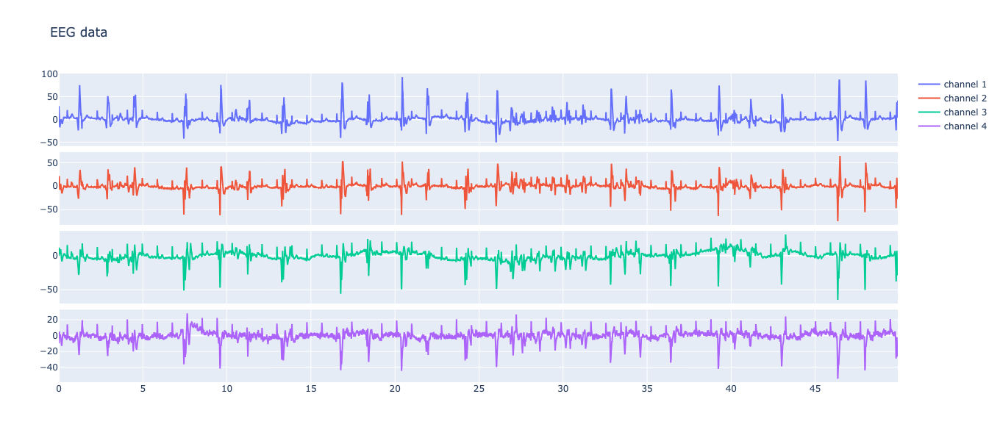

In [75]:
b, a = butter(5, 40, fs=200, btype="low")
eeg_data_filtered = filtfilt(b, a, eeg_data, axis=0, padlen=200)
plot_eeg_data(eeg_data_filtered[8:-8])

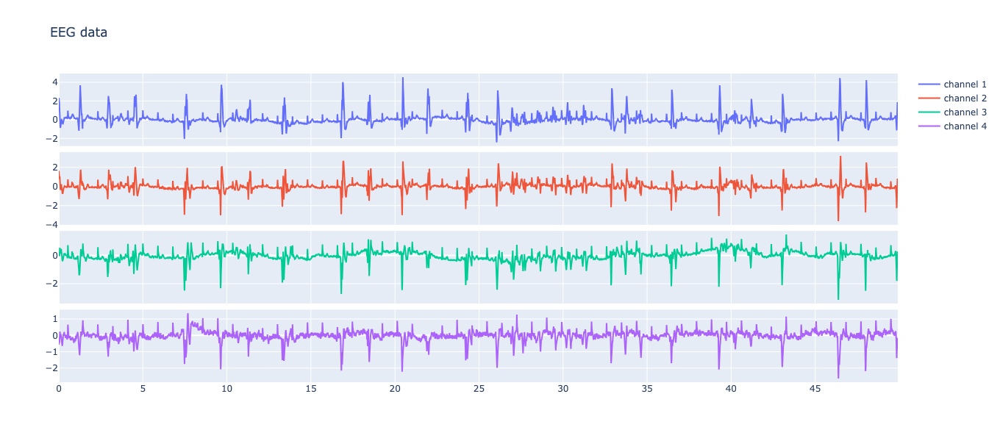

In [85]:
sos = butter(4, 0.5, fs=200, btype="high", output="sos")
fs = 200
nyq = fs / 2
ripple_db=30
width=500/nyq
num_of_taps, beta = kaiserord(ripple_db, width)
cutoff_hz = 0.5
taps = firwin2(num_of_taps+1, freq=[0, cutoff_hz/nyq, 10/nyq, 1], gain=[0, 0.1, 1.0, 0], window=('kaiser', beta), )
# eeg_data_filtered = sosfiltfilt(sos, eeg_data_filtered, axis=0)
eeg_data_filtered = filtfilt(taps, [1.0], eeg_data_filtered, axis=0)

plot_eeg_data(eeg_data_filtered[8:-8])

In [29]:
from scipy.fft import fft, ifft
from sklearn.utils import check_random_state

def _new_random_fft_phase_odd(c, n, random_state):
    rng = check_random_state(random_state)
    random_phase = 2j * np.pi * rng.random((c, (n - 1) // 2))
    return np.concatenate(
        [np.zeros((c, 1)), random_phase, -np.flip(random_phase, [-1])], axis=-1
    )

def _new_random_fft_phase_even(c, n, random_state):
    rng = check_random_state(random_state)
    random_phase = 2j * np.pi * rng.random((c, n // 2 - 1))
    return np.concatenate(
        [
            np.zeros((c, 1)),
            random_phase,
            np.zeros((c, 1)),
            -np.flip(random_phase, [-1]),
        ],
        axis=-1,
    )

_new_random_fft_phase = {0: _new_random_fft_phase_even, 1: _new_random_fft_phase_odd}

def ft_surrogate(X, phase_noise_magnitude, channel_indep=False, random_state=None):
    """FT surrogate augmentation of a single EEG channel, as proposed in [1]_.
    Function copied from https://github.com/cliffordlab/sleep-convolutions-tf
    and modified.
    Parameters
    ----------
    X : torch.Tensor
        EEG input example or batch.
    y : torch.Tensor
        EEG labels for the example or batch.
    phase_noise_magnitude: float
        Float between 0 and 1 setting the range over which the phase
        perturbation is uniformly sampled:
        [0, `phase_noise_magnitude` * 2 * `pi`].
    channel_indep : bool
        Whether to sample phase perturbations independently for each channel or
        not. It is advised to set it to False when spatial information is
        important for the task, like in BCI.
    random_state: int | numpy.random.Generator, optional
        Used to draw the phase perturbation. Defaults to None.
    Returns
    -------
    torch.Tensor
        Transformed inputs.
    torch.Tensor
        Transformed labels.
    References
    ----------
    .. [1] Schwabedal, J. T., Snyder, J. C., Cakmak, A., Nemati, S., &
       Clifford, G. D. (2018). Addressing Class Imbalance in Classification
       Problems of Noisy Signals by using Fourier Transform Surrogates. arXiv
       preprint arXiv:1806.08675.
    """
    f = fft(X, axis=-1)
    n = f.shape[-1]
    random_phase = _new_random_fft_phase[n % 2](
        f.shape[-2] if channel_indep else 1, n, random_state=random_state
    )
    if not channel_indep:
        random_phase = np.tile(random_phase, (f.shape[0], 1))
    f_shifted = f * np.exp(phase_noise_magnitude * random_phase)
    shifted = ifft(f_shifted, axis=-1)
    transformed_X = shifted.real
    return transformed_X

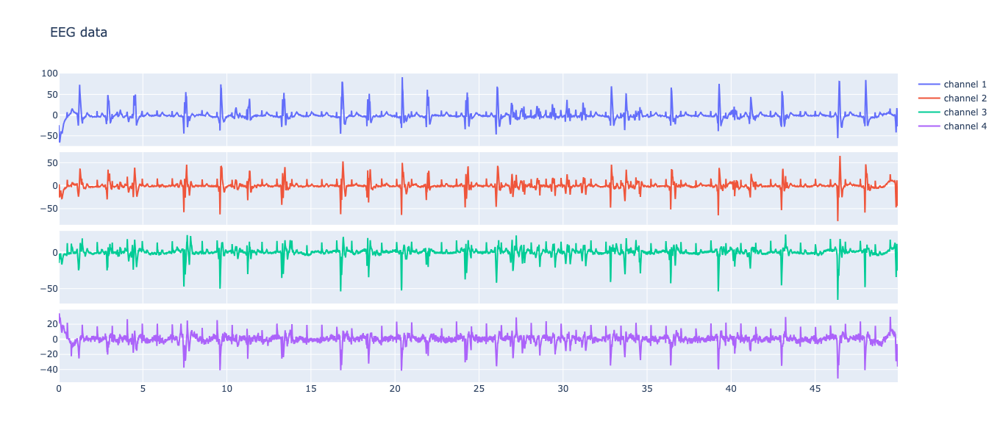

In [30]:
eeg_data_aug = ft_surrogate(eeg_data_filtered, 0.05)
plot_eeg_data(eeg_data_aug[8:-8])

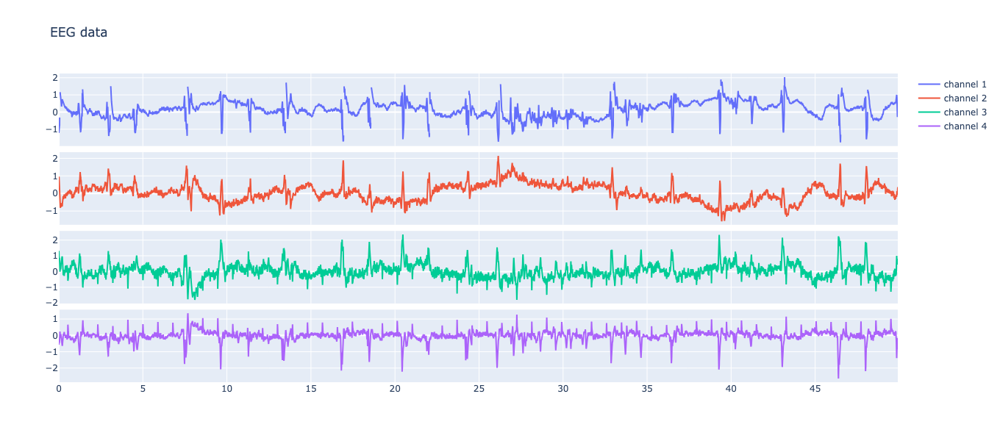

In [88]:
eeg_data_filtered[:, 0] = eeg_data_filtered[:, 0] - eeg_data_filtered[:, 1]
eeg_data_filtered[:, 0] = np.log1p(np.abs(eeg_data_filtered[:, 0])) * np.sign(eeg_data_filtered[:, 0])
eeg_data_filtered[:, 1] = eeg_data_filtered[:, 1] - eeg_data_filtered[:, 2]
eeg_data_filtered[:, 2] = eeg_data_filtered[:, 2] - eeg_data_filtered[:, 3]
plot_eeg_data(eeg_data_filtered[8:-8])